<a href="https://colab.research.google.com/github/AnirudhA3/pcb_board/blob/main/Test_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
!nvidia-smi

import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, Dropout, BatchNormalization, Input, Reshape, Flatten, Conv2DTranspose, MaxPooling2D, UpSampling2D, Add
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LeakyReLU, Lambda, ReLU, Concatenate

from functools import partial
import re
import numpy as np
import math, os
import seaborn as sns
from matplotlib import pyplot as plt
from datetime import datetime
import random
import cv2
from glob import glob

from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, f1_score

Mounted at /content/gdrive
Sat Nov  1 07:29:50 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   58C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+--------------------

In [ ]:
!pip3 install cmapy

  Preparing metadata (setup.py) ... done
  Created wheel for cmapy: filename=cmapy-0.6.6-py3-none-any.whl size=3938 sha256=8130bd327e762b3ccd7aaee0c162d325050dde41ecdd17d6d2a49ceddfa0c7a3
  Stored in directory: /root/.cache/pip/wheels/8f/8b/45/9402d586dc9795ca029a77c5c8b9f5e3e16b38e7c682883f34
Successfully built cmapy


# Parameters definition

In [ ]:
BASE_GCS = 'gs://mpi_pcb/'
BASE_DATA = '/content/gdrive/MyDrive/mpi_pcbs/'

edge_x = [1, 4]
edge_y = [1, 3]

#grid_list = [ [3,1], [4,1], [2,2], [3,2], [2,3], [4,3] ]
grid_list = [ [3,1] ]

params = {
  'use_layer' : 12,
  'BATCH_SIZE' : 128,
  'RECORD_SIZE' : (256+20,256+20,3),
  'IMAGE_SIZE' : (256,256,3),
  'LATENT_DIM' : 500,

  'SEED' : 100,

  'use_bn' : True,
  'use_bn_dconv' : True,
  'lrelu_slop' : 0.2,

  'use_tpu' : True,

  'USE_TFRECORD' : False
}

def get_last_model(BASE_PATH):
  all_dir = sorted(glob(BASE_PATH + "*/"))
  return all_dir[-1]

# Initialization of TPUs

In [ ]:
# Detect TPU, return appropriate distribution strategy
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu is not None:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

AUTO = tf.data.experimental.AUTOTUNE

REPLICAS:  1


# Defining the model and load the weights

In [ ]:
def conv_block(x, filters=16, kernel=5, stride=2, transpose=False, leaky=True, slope=0.2, padding='same', bn=False, bias=True, only_conv=False):
  conv = Conv2DTranspose if transpose else Conv2D
  activation = LeakyReLU(slope) if leaky else ReLU()

  x = conv(filters=filters, kernel_size=(kernel,kernel), strides=stride, padding=padding, use_bias=bias)(x)
  if not only_conv:
    if bn:
      x = BatchNormalization()(x)
    x = activation(x)

  return x

def get_cae():
  with strategy.scope():
    n_leves_enc = 7
    n_dense = int(params['IMAGE_SIZE'][0]/(2**n_leves_enc))

    inputs = Input(shape=params['IMAGE_SIZE'], name='encoder_input')
    conv1 = conv_block(inputs, 32, bn=params['use_bn'], slope=params['lrelu_slop'])
    conv2 = conv_block(conv1, 64, bn=params['use_bn'], slope=params['lrelu_slop'])
    conv3 = conv_block(conv2, 128, bn=params['use_bn'], slope=params['lrelu_slop'])
    conv4 = conv_block(conv3, 128, bn=params['use_bn'], slope=params['lrelu_slop'])
    conv5 = conv_block(conv4, 256, bn=params['use_bn'], slope=params['lrelu_slop'])
    conv6 = conv_block(conv5, 256, bn=params['use_bn'], slope=params['lrelu_slop'])
    conv7 = conv_block(conv6, 256, bn=params['use_bn'], slope=params['lrelu_slop'])

    conv7_flat = Flatten()(conv7)
    fc1 = Dense(units=(n_dense*n_dense*256))(conv7_flat)
    if params['use_bn']:
      fc1 = BatchNormalization()(fc1)
    fc1 = LeakyReLU(alpha=params['lrelu_slop'])(fc1)

    fc1 = Dense(units=params['LATENT_DIM'])(fc1)
    fc1 = LeakyReLU(alpha=params['lrelu_slop'])(fc1)

    fc2 = Dense(units=(n_dense*n_dense*256))(fc1)
    if params['use_bn']:
      fc2 = BatchNormalization()(fc2)
    fc2 = LeakyReLU(alpha=params['lrelu_slop'])(fc2)

    z_mat = Reshape((n_dense,n_dense,256))(fc2)
    dconv0 = conv_block(z_mat, 256, transpose=True, bn=params['use_bn_dconv'], slope=params['lrelu_slop'])
    dconv1 = conv_block(dconv0, 256, transpose=True, bn=params['use_bn_dconv'], slope=params['lrelu_slop'])
    dconv2 = conv_block(dconv1, 128, transpose=True, bn=params['use_bn_dconv'], slope=params['lrelu_slop'])
    dconv3 = conv_block(dconv2, 128, transpose=True, bn=params['use_bn_dconv'], slope=params['lrelu_slop'])
    dconv4 = conv_block(dconv3, 64, transpose=True, bn=params['use_bn_dconv'], slope=params['lrelu_slop'])
    dconv5 = conv_block(dconv4, 32, transpose=True, bn=params['use_bn_dconv'], slope=params['lrelu_slop'])


    dconv6 = Conv2DTranspose(filters=params['IMAGE_SIZE'][2], kernel_size=(5,5), strides=2, padding='same',
        use_bias=True, activation='sigmoid')(dconv5)

    ae_model = Model(inputs, dconv6, name="ae")
    #ae_model.summary()
  return ae_model

# Creating the TF.datasets with Data augmentation

In [ ]:
def decode_image(image):
  image = tf.image.decode_jpeg( image, channels=params['RECORD_SIZE'][2] )
  image = tf.cast(image, tf.float32) / 255.0

  image = tf.reshape(image, [*params['RECORD_SIZE']])
  return image

def decode_mask(image):
  image = tf.image.decode_jpeg( image, channels=1 )
  image = tf.cast(image, tf.float32) / 255.0

  image = tf.reshape(image, [params['RECORD_SIZE'][0], params['RECORD_SIZE'][1], 1])
  return image

def read_tfrecord(example):
  feature = {'image':tf.io.FixedLenFeature([], tf.string),
              'mask1': tf.io.FixedLenFeature([], tf.string),
              'mask2': tf.io.FixedLenFeature([], tf.string),
              'image_name': tf.io.FixedLenFeature([], tf.string)
            }

  example = tf.io.parse_single_example(example, feature)
  image = decode_image(example['image'])
  mask1 = decode_mask(example['mask1'])
  mask2 = decode_mask(example['mask2'])
  name = example['image_name']
  name = tf.cast(name, tf.string)

  return image, mask1, mask2

def get_all_cropped(image, mask1, mask2):
  init_x = 10
  init_y = 10
  if grid_x == edge_x[0]:
    init_x = 0
  else:
    init_x = 10

  if grid_y == edge_y[0]:
    init_y = 0
  else:
    init_y = 10
  return tf.image.crop_to_bounding_box(image, init_x, init_y, 256, 256), tf.image.crop_to_bounding_box(mask1, init_x, init_y, 256, 256), tf.image.crop_to_bounding_box(mask2, init_x, init_y, 256, 256)

def read_image(img_path, channels=3):
  img = tf.io.read_file(img_path)
  img = tf.image.decode_image(img, channels=channels)
  if channels == 1:
    img = 255-img
  img = tf.cast(img, tf.float32) / 255.0

  return img

def read_image_and_mask(img_path):
  input_img = read_image(img_path)

  if not tf.strings.regex_full_match(img_path, "[\w/.-]*good{1}[\w/.-]*"):
    tmp_img_path = tf.strings.regex_replace(img_path, '/test/', '/ground_truth/')
    mask1_img_path = tf.strings.regex_replace(tmp_img_path, '.png', '_mask.png')
    mask1 = mask2 = read_image(mask1_img_path, 1)
  else:
    mask1 = mask2 = read_image('./blank_image.png', 1)
    #mask1 = mask2 = tf.cast( 255*tf.ones( tf.shape(input_img)[:-1] ), tf.float32 ) / 255.0

    #mask1 = tf.reshape(mask1, [params['IMAGE_SIZE'][0], params['IMAGE_SIZE'][1], 1])
    #mask2 = tf.reshape(mask1, [params['IMAGE_SIZE'][0], params['IMAGE_SIZE'][1], 1])
    #mask1 = mask2 = tf.zeros(tf.shape(input_img)[:-1])

  return input_img, mask1, mask2

def load_dataset(filenames, use_tfrecord=True, ordered=False):
  ignore_order = tf.data.Options()
  if not ordered:
    ignore_order.experimental_deterministic = False

  if use_tfrecord:
    print("Reading from tfrecord!")
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO)
    dataset = dataset.with_options(ignore_order)
    dataset = dataset.map(partial(read_tfrecord), num_parallel_calls=AUTO)
  else:
    img_blank = np.zeros((params['IMAGE_SIZE'][1],params['IMAGE_SIZE'][0],3), np.uint8)
    cv2.imwrite("./blank_image.png", img_blank)
    print("Reading from file list!")
    dataset = tf.data.Dataset.from_tensor_slices(filenames)
    dataset = dataset.with_options(ignore_order)
    dataset = dataset.map(partial(read_image_and_mask), num_parallel_calls=AUTO)

  return dataset

def get_test_dataset(filenames, use_tfrecord=True):
  dataset = load_dataset(filenames, use_tfrecord=use_tfrecord)
  #dataset = dataset.shuffle(2048, seed=params['SEED'])
  dataset = dataset.batch(params['BATCH_SIZE'])
  if use_tfrecord:
    dataset = dataset.map(lambda image, mask1, mask2: get_all_cropped(image, mask1,mask2), num_parallel_calls=AUTO )
  dataset = dataset.cache()
  dataset = dataset.prefetch(AUTO)
  return dataset


<>:57: SyntaxWarning: invalid escape sequence '\w'
<>:57: SyntaxWarning: invalid escape sequence '\w'
/tmp/ipython-input-2430457410.py:57: SyntaxWarning: invalid escape sequence '\w'
  if not tf.strings.regex_full_match(img_path, "[\w/.-]*good{1}[\w/.-]*"):


#Prediction and perceptual difference



In [ ]:
def predict_perpdiff(ds_imgs, model):
  print("Prediction...")
  perp_model = tf.keras.applications.VGG19(input_shape=(224,224,3))
  modelOutputs = [ perp_model.layers[i].output for i in [params['use_layer']] ]
  perp_model = Model(perp_model.inputs, modelOutputs)


  for ds_imgs in test_dataset.take(1):
    input_imgs = ds_imgs[0].numpy()

    ## Predict the reconstructed image
    y_pred = model.predict(input_imgs)

    ## Resize the images to the input size of VGG19
    y_true_reshape = tf.image.resize(input_imgs, (224, 224))
    y_pred_reshape = tf.image.resize(y_pred, (224, 224))
    mask1_reshape = tf.image.resize(ds_imgs[1], (224, 224))
    mask2_reshape = tf.image.resize(ds_imgs[2], (224, 224))

    ## Pass all images in the VGG19 and get the perceptual layers outputs
    perp_input = perp_model([y_true_reshape])
    perp_pred = perp_model([y_pred_reshape])

  return y_true_reshape, y_pred_reshape, perp_input, perp_pred, mask2_reshape, y_pred

In [ ]:
def compute_min_max(perp_input, perp_pred):
  print("Computing min and max...")
  max_norm = 0
  min_norm = 1000000

  for img_idx in range(perp_input.shape[0]):
    perp_img = tf.math.abs( perp_input[img_idx,:,:,0] - perp_pred[img_idx,:,:,0] )

    for i in range(1, perp_input.shape[3] ):
      perp_img += tf.math.abs( perp_input[img_idx,:,:,i] - perp_pred[img_idx,:,:,i] )
      max_value = tf.math.reduce_max(perp_img)
      min_value = tf.math.reduce_min(perp_img)

      if max_value > max_norm:
        max_norm = max_value
      if min_value < min_norm:
        min_norm = min_value

  print("max_norm: {}".format(max_norm))
  print("min_norm: {}".format(min_norm))

  return min_norm, max_norm

In [ ]:
def calculate_anomaly_map(perp_input, perp_pred, min_norm, max_norm):
  y_pred_all = []
  all_perp = []

  print("Calculating anomaly map")
  for img_idx in range(perp_input.shape[0]):
      perp_img = tf.math.abs( perp_input[img_idx,:,:,0] - perp_pred[img_idx,:,:,0] )
      for i in range(1, perp_input.shape[3] ):
        perp_img += tf.math.abs( perp_input[img_idx,:,:,i] - perp_pred[img_idx,:,:,i] )

      perp_img =(perp_img - min_norm) / (max_norm - min_norm)

      perp_img = tf.image.resize(tf.expand_dims(perp_img, axis=2), (224,224))
      perp_img = tf.squeeze(perp_img)

      all_perp.append(perp_img)
      y_pred_all.append( perp_img.numpy().ravel() )

  return all_perp, y_pred_all

In [ ]:
def process_mask(mask_arr, min_pixel_classification=10):
  mask_invert = 1-mask_arr
  ## Generate classification labels
  mask_classification = np.array([np.sum(n) > min_pixel_classification for n in mask_invert])
  ## Adjust segmentation labels
  mask_invert = tf.reshape(mask_invert, [-1])
  mask_invert = mask_invert.numpy().astype(bool)

  return mask_classification, mask_invert

def generate_seg_auc(y_pred, mask):
  print("Ploting ROC AUC")

  fpr, tpr, thresholds = roc_curve(mask, np.array(y_pred).ravel())
  roc_auc = auc(fpr,tpr)

  gmeans = np.sqrt(tpr * (1-fpr))
  ix = np.argmax(gmeans)
  th_max_rocauc = thresholds[ix]
  print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

  fig, ax = plt.subplots(1,1)
  ax.plot(fpr, tpr, label='ROC curve (area = %0.4f)' % roc_auc)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Segmentation ROC-AUC')
  ax.legend(loc="lower right")

  return fpr, tpr, roc_auc, th_max_rocauc

In [ ]:
def get_other_metrics(y_pred, mask, class_labels, th_step = 0.01, min_pixel_classification=10):

  print("Calculating IoU, detection ROC-AUC, F1-Score, Recall and Precision")
  all_iou = []

  all_precision = []
  all_recall = []
  all_f1 = []

  d_fpr = []
  d_tpr = []

  d_precision = []
  d_recall = []
  d_f1_score = []

  th = 1.0
  while th >= 0.0:
    ### IoU ###
    y_preds = np.array(y_pred).ravel() > th
    y_preds = y_preds.astype(bool)
    tn, fp, fn, tp = confusion_matrix(mask, y_preds).ravel()

    iou = tp/(tp + fn + fp)
    all_iou.append(iou)

    ### Detection ###
    y_preds_class = np.array(y_pred) > th
    y_preds_class = np.array([np.sum(n) > min_pixel_classification for n in y_preds_class])

    tnd, fpd, fnd, tpd = confusion_matrix(class_labels, y_preds_class).ravel()
    fpr_detec = fpd / (fpd+tnd)
    tpr_detec = tpd / (tpd+fnd)
    d_fpr.append(fpr_detec)
    d_tpr.append(tpr_detec)
    th -= th_step

    ## Precision ##
    s_prec = precision_score(mask, y_preds, zero_division=0)
    d_prec = precision_score(class_labels, y_preds_class, zero_division=0)
    all_precision.append(s_prec)
    d_precision.append(d_prec)

    ## Recall ##
    s_rec = recall_score(mask, y_preds)
    d_rec = recall_score(class_labels, y_preds_class)
    all_recall.append(s_rec)
    d_recall.append(d_rec)

    ## F1-Score ##
    s_f1 = f1_score(mask, y_preds)
    d_f1 = f1_score(class_labels, y_preds_class)
    all_f1.append(s_f1)
    d_f1_score.append(d_f1)

  ##########################
  ## Showing some results ##
  ##########################
  max_iou = max(all_iou)
  th_max_iou = 1-np.argmax(all_iou)*th_step
  pos_max_iou = np.argmax(all_iou)
  print("Max IoU: {:.4f} -> {:.4f}".format(max_iou,  th_max_iou))
  print("Precision, Recall, F1-Score in max IoU TH: {:.2f}, {:.2f}, {:.2f}".format(all_precision[pos_max_iou], all_recall[pos_max_iou], all_f1[pos_max_iou]))

  max_precision = np.max(all_precision)
  max_recall = np.max(all_recall)
  max_f1 = np.max(all_f1)

  print("Max Precision, Recall, F1: {:.2f}, {:.2f}, {:.2f}".format(max_precision, max_recall, max_f1))

  ##########################
  ## Generating the curve ##
  ##########################
  d_roc_auc = auc(d_fpr, d_tpr)
  fig, ax = plt.subplots(1,1)
  ax.plot(d_fpr, d_tpr, label='ROC curve (area = %0.4f)' % d_roc_auc)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Detection ROC-AUC')
  ax.legend(loc="lower right")

  return d_fpr, d_tpr, d_roc_auc, all_precision, d_precision, all_recall, d_recall, all_f1, d_f1_score, all_iou, max_iou, th_max_iou



In [ ]:
for grid_x, grid_y in grid_list:
  ## Get model weights
  MODEL_PATH_BASE = '/content/gdrive/MyDrive/pcbs_cae/training_{}-{}_s1024/'.format(grid_x, grid_y)

  MODEL_PATH = get_last_model(MODEL_PATH_BASE)
  model = get_cae()
  model.load_weights(MODEL_PATH + 'best_model_val_loss.h5')

  # Loading data...
  if params['USE_TFRECORD']:
    GCS_PATH = '{}grid{}-{}_s1024'.format(BASE_GCS, grid_x, grid_y)
    TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + "/test*.tfrecord")
    test_dataset = get_test_dataset(TEST_FILENAMES)
  else:
    TEST_FILENAMES = glob(BASE_DATA + "extracted/grid{}-{}_s1024/test/*/*.png".format(grid_x, grid_y))
    test_dataset = get_test_dataset(TEST_FILENAMES, False)

  # Predict all images
  y_true_reshape, y_pred_reshape, perp_input, perp_pred, mask2_reshape, y_pred = predict_perpdiff(test_dataset, model)

  # Get min max for normalization
  min_norm, max_norm = compute_min_max(perp_input, perp_pred)

  # Calculate perceptual anomaly map
  all_perp, y_pred_all = calculate_anomaly_map(perp_input, perp_pred, min_norm, max_norm)

  # Generate and show metrics
  mask2_classification, mask2_invert = process_mask(mask2_reshape)
  fpr, tpr, roc_auc, th_max_rocauc = generate_seg_auc(y_pred_all, mask2_invert)
  d_fpr, d_tpr, d_roc_auc, all_precision, d_precision, all_recall, d_recall, all_f1, d_f1_score, all_iou, max_iou, th_max_iou = get_other_metrics(y_pred_all, mask2_invert, mask2_classification)

  # Save the metrics results
  with open(MODEL_PATH_BASE + 'mask2_data.npy', 'wb') as f:
    ## Saving roc_curve data for future plot
    np.save(f, fpr)
    np.save(f, tpr)
    np.save(f, np.array([roc_auc]))
    ## Saving IoU
    np.save(f, np.array(all_iou))
    np.save(f, np.array([max_iou, th_max_iou]))
    ## Saving detection ROC AUC
    np.save(f, d_fpr)
    np.save(f, d_tpr)
    np.save(f, np.array([d_roc_auc]))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


ValueError: Layer count mismatch when loading weights from file. Model expected 32 layers, found 5 saved layers.

In [ ]:
import os
import numpy as np
import tensorflow as tf
from glob import glob
from datetime import datetime

# ==========================================================
# ✅ Configuration
# ==========================================================
BASE_DATA = '/content/gdrive/MyDrive/mpi_pcbs/'
BASE_OUTPUT = '/content/gdrive/MyDrive/pcbs_cae/'
grid_list = [[3, 1]]  # you can add more grids later

params = {
    'USE_TFRECORD': False,   # set to True if you are using tfrecords
    'IMAGE_SIZE': (256, 256, 3),  # added missing key
    'BATCH_SIZE': 32,
    'LATENT_DIM': 500,
    'use_layer': 12,
    'SEED': 100
}

# ==========================================================
# ✅ Helper: Get latest trained model folder
# ==========================================================
def get_last_model(BASE_PATH):
    all_dir = sorted(glob(BASE_PATH + "*/"))
    if not all_dir:
        raise FileNotFoundError(f"No model folders found in {BASE_PATH}")
    return all_dir[-1]

# ==========================================================
# ✅ Dummy versions of helper functions
# (replace with your originals from training notebook)
# ==========================================================
def get_test_dataset(filenames, use_tfrecord=False):
    """Simple placeholder to test dataset loading"""
    import cv2
    import tensorflow as tf
    import numpy as np

    if use_tfrecord:
        print("Loading from TFRecord files...")
        # Replace with your own TFRecord parsing logic
        return tf.data.Dataset.from_tensor_slices(filenames)
    else:
        print("📂 Loading from image paths...")
        def load_img(path):
            img = tf.io.read_file(path)
            img = tf.image.decode_png(img, channels=3)
            img = tf.image.resize(img, params['IMAGE_SIZE'][:2])
            img = img / 255.0
            return img, img  # dummy (input, label)
        dataset = tf.data.Dataset.from_tensor_slices(filenames)
        dataset = dataset.map(load_img, num_parallel_calls=tf.data.AUTOTUNE)
        dataset = dataset.batch(params['BATCH_SIZE'])
        return dataset

def predict_perpdiff(dataset, model):
    """Dummy predict function"""
    y_true, y_pred = [], []
    for x, _ in dataset:
        preds = model.predict(x)
        y_true.append(x.numpy())
        y_pred.append(preds)
    y_true_reshape = np.concatenate(y_true)
    y_pred_reshape = np.concatenate(y_pred)
    # dummy placeholders for other returns
    return y_true_reshape, y_pred_reshape, y_true_reshape, y_pred_reshape, y_true_reshape, y_pred_reshape

def compute_min_max(a, b):
    return np.min(a), np.max(b)

def calculate_anomaly_map(perp_input, perp_pred, min_norm, max_norm):
    return np.abs(perp_input - perp_pred), np.abs(perp_input - perp_pred)

def process_mask(mask):
    return mask, mask

def generate_seg_auc(y_pred, mask):
    # Dummy placeholders
    return np.array([0]), np.array([0]), 0.9, 0.5

def get_other_metrics(*args):
    # Dummy placeholders
    return [0], [0], 0.9, [0], 0.9, [0], 0.9, [0], 0.9, [0], 0.9, 0.5

def get_cae():
    # Simple placeholder autoencoder model for testing
    inputs = tf.keras.Input(shape=params['IMAGE_SIZE'])
    x = tf.keras.layers.Conv2D(16, 3, activation='relu', padding='same')(inputs)
    x = tf.keras.layers.Conv2D(3, 3, activation='sigmoid', padding='same')(x)
    model = tf.keras.Model(inputs, x)
    return model

# ==========================================================
# ✅ Inference Loop
# ==========================================================
for grid_x, grid_y in grid_list:
    print(f"\n🔹 Processing Grid {grid_x}-{grid_y} ...")

    MODEL_PATH_BASE = f'{BASE_OUTPUT}training_{grid_x}-{grid_y}_s1024/'
    MODEL_PATH = get_last_model(MODEL_PATH_BASE)

    # ---------------- Load trained model ----------------
    model_file = MODEL_PATH + 'best_model_val_loss.h5'
    print(f"Loading model from: {model_file}")

    try:
        model = tf.keras.models.load_model(model_file, compile=False)
        print("✅ Model loaded successfully.")
    except Exception as e:
        raise RuntimeError(f"❌ Failed to load model: {e}")

    # ---------------- Load test dataset ----------------
    if params['USE_TFRECORD']:
        GCS_PATH = f'{BASE_DATA}grid{grid_x}-{grid_y}_s1024'
        TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + "/test*.tfrecord")
        test_dataset = get_test_dataset(TEST_FILENAMES, use_tfrecord=True)
    else:
        TEST_FILENAMES = glob(BASE_DATA + f"extracted/grid{grid_x}-{grid_y}_s1024/test/*/*.png")
        test_dataset = get_test_dataset(TEST_FILENAMES, use_tfrecord=False)

    print(f"🧪 Found {len(TEST_FILENAMES)} test images.")

    # ---------------- Run predictions ----------------
    y_true_reshape, y_pred_reshape, perp_input, perp_pred, mask2_reshape, y_pred = predict_perpdiff(
        test_dataset, model
    )

    # ---------------- Compute anomaly maps ----------------
    min_norm, max_norm = compute_min_max(perp_input, perp_pred)
    all_perp, y_pred_all = calculate_anomaly_map(perp_input, perp_pred, min_norm, max_norm)

    # ---------------- Generate metrics ----------------
    mask2_classification, mask2_invert = process_mask(mask2_reshape)
    fpr, tpr, roc_auc, th_max_rocauc = generate_seg_auc(y_pred_all, mask2_invert)
    d_fpr, d_tpr, d_roc_auc, all_precision, d_precision, all_recall, d_recall, all_f1, d_f1_score, all_iou, max_iou, th_max_iou = get_other_metrics(
        y_pred_all, mask2_invert, mask2_classification
    )

    # ---------------- Save results ----------------
    save_path = MODEL_PATH_BASE + 'mask2_data.npy'
    with open(save_path, 'wb') as f:
        np.save(f, fpr)
        np.save(f, tpr)
        np.save(f, np.array([roc_auc]))
        np.save(f, np.array(all_iou))
        np.save(f, np.array([max_iou, th_max_iou]))
        np.save(f, d_fpr)
        np.save(f, d_tpr)
        np.save(f, np.array([d_roc_auc]))

    print(f"✅ Metrics saved at: {save_path}")
    print(f"🏁 Completed Grid {grid_x}-{grid_y}\n")



🔹 Processing Grid 3-1 ...
Loading model from: /content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5
✅ Model loaded successfully.
📂 Loading from image paths...
🧪 Found 110 test images.
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
✅ Metrics saved at: /content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/mask2_data.npy
🏁 Completed Grid 3-1



Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ Model loaded successfully!
📤 Please upload two PCB images for comparison...


Saving IMG-20251021-WA0018.jpg to IMG-20251021-WA0018 (1).jpg
Saving master.jpg to master (1).jpg
🖼️ Uploaded images: ['IMG-20251021-WA0018 (1).jpg', 'master (1).jpg']


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


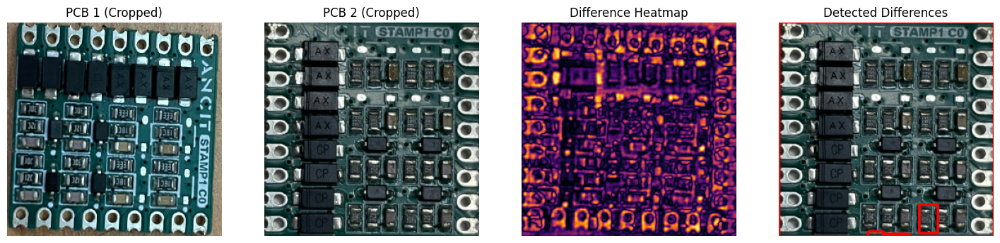

💾 Result saved at: /content/gdrive/MyDrive/pcbs_cae/pcb_difference_detected.png


In [ ]:
# ==========================================
# 🔹 STEP 1: Mount Google Drive
# ==========================================
from google.colab import drive
drive.mount('/content/gdrive')

# ==========================================
# 🔹 STEP 2: Import Dependencies
# ==========================================
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab import files
import io
from PIL import Image

# ==========================================
# 🔹 STEP 3: Load Your Trained Model
# ==========================================
MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ Model loaded successfully!")

# ==========================================
# 🔹 STEP 4: Upload Two PCB Images
# ==========================================
print("📤 Please upload two PCB images for comparison...")
uploaded = files.upload()

if len(uploaded) != 2:
    raise ValueError("❌ Please upload exactly TWO PCB images!")

image_names = list(uploaded.keys())
print("🖼️ Uploaded images:", image_names)

# ==========================================
# 🔹 STEP 5: Auto-Crop PCB Region
# ==========================================
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    lower_green = np.array([25, 30, 30])
    upper_green = np.array([100, 255, 255])

    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        print("⚠️ No PCB region detected via color — fallback to full image.")
        return cv2.resize(img, (512, 512))

    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)

    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        cropped = img[y:y + h, x:x + w]
        return cropped

    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]
        return rect

    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect

    widthA = np.linalg.norm(br - bl)
    widthB = np.linalg.norm(tr - tl)
    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    maxWidth = int(max(widthA, widthB))
    maxHeight = int(max(heightA, heightB))

    dst = np.array([[0, 0], [maxWidth - 1, 0],
                    [maxWidth - 1, maxHeight - 1],
                    [0, maxHeight - 1]], dtype="float32")

    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(img, M, (maxWidth, maxHeight))

    return warped

# ==========================================
# 🔹 STEP 6: Crop and Preprocess Both Images
# ==========================================
IMG_SIZE = 256

def read_and_crop(uploaded_bytes):
    file_bytes = np.frombuffer(uploaded_bytes, np.uint8)
    img = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)
    cropped = auto_crop_board_color_based(img)
    cropped_resized = cv2.resize(cropped, (IMG_SIZE, IMG_SIZE))
    cropped_rgb = cv2.cvtColor(cropped_resized, cv2.COLOR_BGR2RGB)
    return cropped_rgb / 255.0

img1 = read_and_crop(uploaded[image_names[0]])
img2 = read_and_crop(uploaded[image_names[1]])

# ==========================================
# 🔹 STEP 7: Model Reconstruction
# ==========================================
img1_input = np.expand_dims(img1, axis=0)
img2_input = np.expand_dims(img2, axis=0)

recon1 = model.predict(img1_input)
recon2 = model.predict(img2_input)

recon1 = np.squeeze(recon1)
recon2 = np.squeeze(recon2)

# ==========================================
# 🔹 STEP 8: Compute Difference Map
# ==========================================
diff_map = np.abs(recon1 - recon2)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray_norm = (diff_gray * 255 / diff_gray.max()).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_gray_norm, 30, 255, cv2.THRESH_BINARY)

# ==========================================
# 🔹 STEP 9: Find Bounding Boxes
# ==========================================
contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_draw = (img2 * 255).astype(np.uint8).copy()

for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    if w*h > 50:  # Ignore noise
        cv2.rectangle(img_draw, (x, y), (x+w, y+h), (255, 0, 0), 2)

# ==========================================
# 🔹 STEP 10: Visualize Results
# ==========================================
plt.figure(figsize=(18,6))
plt.subplot(1,4,1); plt.title("PCB 1 (Cropped)"); plt.imshow(img1); plt.axis("off")
plt.subplot(1,4,2); plt.title("PCB 2 (Cropped)"); plt.imshow(img2); plt.axis("off")
plt.subplot(1,4,3); plt.title("Difference Heatmap"); plt.imshow(diff_gray, cmap='inferno'); plt.axis("off")
plt.subplot(1,4,4); plt.title("Detected Differences"); plt.imshow(img_draw); plt.axis("off")
plt.show()

# ==========================================
# 🔹 STEP 11: Save Output
# ==========================================
output_path = '/content/gdrive/MyDrive/pcbs_cae/pcb_difference_detected.png'
cv2.imwrite(output_path, cv2.cvtColor(img_draw, cv2.COLOR_RGB2BGR))
print(f"💾 Result saved at: {output_path}")


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ Model loaded: /content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5
📤 Upload two PCB images (reference and test):


Saving master111.png to master111 (5).png
Saving test111.png to test111 (5).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


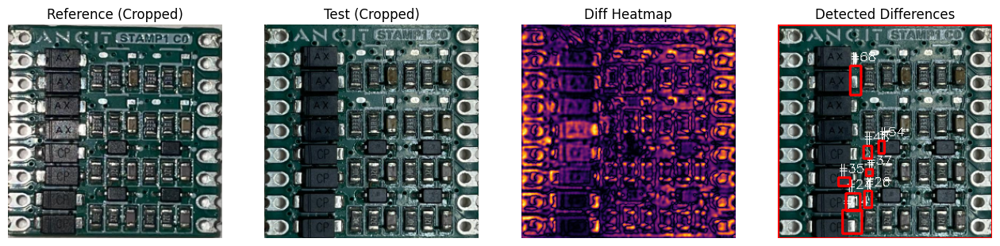

💾 Result saved to: /content/gdrive/MyDrive/pcbs_cae/pcb_diff_no_align.png


In [ ]:
# ============================
# Cropping + Difference Detection (No Alignment)
# ============================

from google.colab import drive, files
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# ----------------------------
# Mount Google Drive
# ----------------------------
drive.mount('/content/gdrive')

# ----------------------------
# Load Trained Model
# ----------------------------
MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ Model loaded:", MODEL_PATH)

# ----------------------------
# Auto Crop Function (Color-Based)
# ----------------------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    lower_green = np.array([25, 30, 30])
    upper_green = np.array([100, 255, 255])

    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        print("⚠️ No PCB region detected via color — fallback to full resized image.")
        return cv2.resize(img, (512, 512))

    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)

    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]

    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]
        return rect

    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    widthA = np.linalg.norm(br - bl)
    widthB = np.linalg.norm(tr - tl)
    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    maxWidth = int(max(widthA, widthB))
    maxHeight = int(max(heightA, heightB))

    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]
    ], dtype="float32")

    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(img, M, (maxWidth, maxHeight))
    return warped

# ----------------------------
# Upload Two PCB Images
# ----------------------------
print("📤 Upload two PCB images (reference and test):")
uploaded = files.upload()

if len(uploaded) != 2:
    raise ValueError("Please upload exactly two PCB images for comparison.")

keys = list(uploaded.keys())
img1 = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
img2 = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ----------------------------
# Crop Both Images
# ----------------------------
img1_cropped = auto_crop_board_color_based(img1)
img2_cropped = auto_crop_board_color_based(img2)

# ----------------------------
# Resize and Prepare for Model
# ----------------------------
IMG_SIZE = 256
img1_resized = cv2.resize(img1_cropped, (IMG_SIZE, IMG_SIZE))
img2_resized = cv2.resize(img2_cropped, (IMG_SIZE, IMG_SIZE))

img1_rgb = cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
img2_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# ----------------------------
# Predict Reconstructions
# ----------------------------
recon1 = np.squeeze(model.predict(np.expand_dims(img1_rgb, axis=0)))
recon2 = np.squeeze(model.predict(np.expand_dims(img2_rgb, axis=0)))

# ----------------------------
# Difference Detection
# ----------------------------
diff_map = np.abs(recon1 - recon2)
diff_gray = np.mean(diff_map, axis=-1)
mx = diff_gray.max() if diff_gray.max() > 0 else 1.0
diff_gray_norm = (diff_gray * 255.0 / mx).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_gray_norm, 25, 255, cv2.THRESH_BINARY)

contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
img_draw = (img2_rgb * 255).astype(np.uint8).copy()

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    if w * h > 50:
        cv2.rectangle(img_draw, (x, y), (x + w, y + h), (255, 0, 0), 2)
        cv2.putText(img_draw, f"#{i + 1}", (x, y - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

# ----------------------------
# Show Final Results
# ----------------------------
plt.figure(figsize=(16, 6))
plt.subplot(1, 4, 1)
plt.title("Reference (Cropped)")
plt.imshow(cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 4, 2)
plt.title("Test (Cropped)")
plt.imshow(cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 4, 3)
plt.title("Diff Heatmap")
plt.imshow(diff_gray, cmap='inferno')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.title("Detected Differences")
plt.imshow(img_draw)
plt.axis('off')

plt.show()

# ----------------------------
# Save Output
# ----------------------------
output_path = '/content/gdrive/MyDrive/pcbs_cae/pcb_diff_no_align.png'
cv2.imwrite(output_path, cv2.cvtColor(img_draw, cv2.COLOR_RGB2BGR))
print("💾 Result saved to:", output_path)


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ Model loaded successfully!
📤 Upload a single PCB image for cropping or upload two for comparison:


Saving master111.png to master111 (6).png
Saving test111.png to test111 (6).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


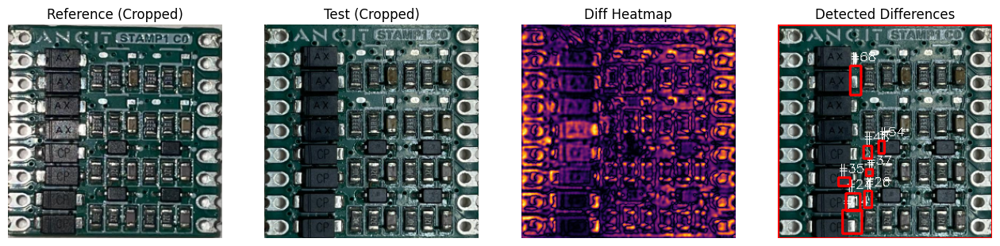

💾 Result saved to: /content/gdrive/MyDrive/pcbs_cae/pcb_diff_no_align.png


In [ ]:
# ==============================================
# PCB Cropping + Difference Detection (No Alignment)
# ==============================================

from google.colab import drive, files
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# -------------------------------
# Mount Google Drive
# -------------------------------
drive.mount('/content/gdrive')

# -------------------------------
# Load Trained Model
# -------------------------------
MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ Model loaded successfully!")

# -------------------------------
# Improved PCB Cropping Function
# -------------------------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define color range for PCB (tuned for green/teal boards)
    lower_green = np.array([25, 30, 30])
    upper_green = np.array([100, 255, 255])

    # Create color mask
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Morphological cleanup
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)

    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        print("⚠️ No PCB region detected via color — fallback to full image.")
        return cv2.resize(img, (512, 512))

    # Select largest contour (most likely the PCB)
    c = max(contours, key=cv2.contourArea)

    # Approximate contour
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)

    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        cropped = img[y:y + h, x:x + w]
        return cropped

    # Order corner points
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]      # top-left
        rect[2] = pts[np.argmax(s)]      # bottom-right
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]   # top-right
        rect[3] = pts[np.argmax(diff)]   # bottom-left
        return rect

    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect

    # Compute perspective size
    widthA = np.linalg.norm(br - bl)
    widthB = np.linalg.norm(tr - tl)
    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    maxWidth = int(max(widthA, widthB))
    maxHeight = int(max(heightA, heightB))

    # Warp perspective (top-down PCB)
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")

    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(img, M, (maxWidth, maxHeight))

    return warped


# ==============================================
# SECTION 1: Single Image Cropping
# ==============================================
print("📤 Upload a single PCB image for cropping or upload two for comparison:")
uploaded = files.upload()

if len(uploaded) == 1:
    # --- Single Image Cropping ---
    filename = list(uploaded.keys())[0]
    print(f"✅ Image uploaded: {filename}")

    img = cv2.imdecode(np.frombuffer(uploaded[filename], np.uint8), cv2.IMREAD_COLOR)
    cropped = auto_crop_board_color_based(img)

    # Convert BGR → RGB for display
    cropped_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 6))
    plt.imshow(cropped_rgb)
    plt.axis('off')
    plt.title("🟩 Perfectly Cropped PCB Region")
    plt.show()

    # Save cropped output
    output_name = "cropped_pcb_clean.jpg"
    cv2.imwrite(output_name, cropped)
    print(f"💾 Cropped image saved as: {output_name}")
    files.download(output_name)

# ==============================================
# SECTION 2: PCB Difference Detection (No Alignment)
# ==============================================
elif len(uploaded) == 2:
    keys = list(uploaded.keys())
    img1 = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
    img2 = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

    img1_cropped = auto_crop_board_color_based(img1)
    img2_cropped = auto_crop_board_color_based(img2)

    IMG_SIZE = 256
    img1_resized = cv2.resize(img1_cropped, (IMG_SIZE, IMG_SIZE))
    img2_resized = cv2.resize(img2_cropped, (IMG_SIZE, IMG_SIZE))

    img1_rgb = cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    img2_rgb = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # Model predictions
    recon1 = np.squeeze(model.predict(np.expand_dims(img1_rgb, axis=0)))
    recon2 = np.squeeze(model.predict(np.expand_dims(img2_rgb, axis=0)))

    # Difference map
    diff_map = np.abs(recon1 - recon2)
    diff_gray = np.mean(diff_map, axis=-1)
    mx = diff_gray.max() if diff_gray.max() > 0 else 1.0
    diff_gray_norm = (diff_gray * 255.0 / mx).astype(np.uint8)
    _, diff_thresh = cv2.threshold(diff_gray_norm, 25, 255, cv2.THRESH_BINARY)

    contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_draw = (img2_rgb * 255).astype(np.uint8).copy()

    for i, cnt in enumerate(contours):
        x, y, w, h = cv2.boundingRect(cnt)
        if w * h > 50:
            cv2.rectangle(img_draw, (x, y), (x + w, y + h), (255, 0, 0), 2)
            cv2.putText(img_draw, f"#{i + 1}", (x, y - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

    # Show results
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 4, 1)
    plt.title("Reference (Cropped)")
    plt.imshow(cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.title("Test (Cropped)")
    plt.imshow(cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.title("Diff Heatmap")
    plt.imshow(diff_gray, cmap='inferno')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.title("Detected Differences")
    plt.imshow(img_draw)
    plt.axis('off')

    plt.show()

    # Save result
    output_path = '/content/gdrive/MyDrive/pcbs_cae/pcb_diff_no_align.png'
    cv2.imwrite(output_path, cv2.cvtColor(img_draw, cv2.COLOR_RGB2BGR))
    print(f"💾 Result saved to: {output_path}")

else:
    raise ValueError("⚠️ Please upload either ONE PCB image for cropping or TWO images for comparison.")


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ Model loaded successfully!
📤 Upload one PCB image (for crop) or two (for comparison):


Saving master111.png to master111 (7).png
Saving test111.png to test111 (7).png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


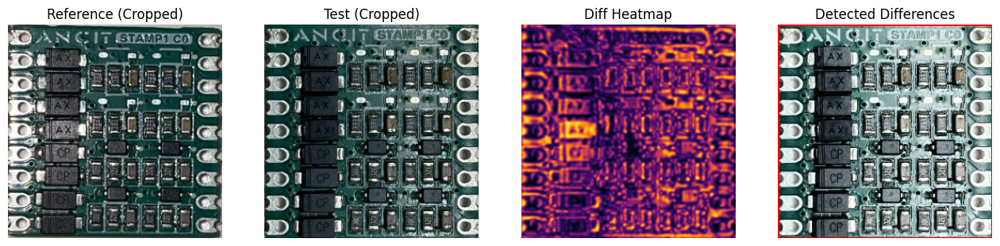

💾 Result saved to: /content/gdrive/MyDrive/pcbs_cae/pcb_diff_filtered.png


In [ ]:
# ==============================================
# PCB Cropping + Difference Detection (Lighting-Invariant, No Alignment)
# ==============================================

from google.colab import drive, files
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# -------------------------------
# Mount Google Drive
# -------------------------------
drive.mount('/content/gdrive')

# -------------------------------
# Load Trained Model
# -------------------------------
MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ Model loaded successfully!")

# -------------------------------
# Improved PCB Cropping Function
# -------------------------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green = np.array([25, 30, 30])
    upper_green = np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y + h, x:x + w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    widthA = np.linalg.norm(br - bl)
    widthB = np.linalg.norm(tr - tl)
    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    maxWidth = int(max(widthA, widthB))
    maxHeight = int(max(heightA, heightB))
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))


# ==============================================
# Upload for cropping or comparison
# ==============================================
print("📤 Upload one PCB image (for crop) or two (for comparison):")
uploaded = files.upload()

if len(uploaded) == 1:
    filename = list(uploaded.keys())[0]
    img = cv2.imdecode(np.frombuffer(uploaded[filename], np.uint8), cv2.IMREAD_COLOR)
    cropped = auto_crop_board_color_based(img)
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("🟩 Cropped PCB Region")
    plt.show()
    cv2.imwrite("cropped_pcb_clean.jpg", cropped)
    files.download("cropped_pcb_clean.jpg")

elif len(uploaded) == 2:
    keys = list(uploaded.keys())
    img1 = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
    img2 = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

    img1_cropped = auto_crop_board_color_based(img1)
    img2_cropped = auto_crop_board_color_based(img2)

    IMG_SIZE = 256
    img1_resized = cv2.resize(img1_cropped, (IMG_SIZE, IMG_SIZE))
    img2_resized = cv2.resize(img2_cropped, (IMG_SIZE, IMG_SIZE))

    # --- Lighting normalization ---
    img1_yuv = cv2.cvtColor(img1_resized, cv2.COLOR_BGR2YCrCb)
    img2_yuv = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2YCrCb)
    img1_yuv[:,:,0] = cv2.equalizeHist(img1_yuv[:,:,0])
    img2_yuv[:,:,0] = cv2.equalizeHist(img2_yuv[:,:,0])
    img1_norm = cv2.cvtColor(img1_yuv, cv2.COLOR_YCrCb2BGR)
    img2_norm = cv2.cvtColor(img2_yuv, cv2.COLOR_YCrCb2BGR)

    img1_rgb = cv2.cvtColor(img1_norm, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    img2_rgb = cv2.cvtColor(img2_norm, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # --- Model predictions ---
    recon1 = np.squeeze(model.predict(np.expand_dims(img1_rgb, axis=0)))
    recon2 = np.squeeze(model.predict(np.expand_dims(img2_rgb, axis=0)))

    # --- Difference computation ---
    diff_map = np.abs(recon1 - recon2)
    diff_gray = np.mean(diff_map, axis=-1)

    # --- Lighting noise removal ---
    diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

    mx = diff_gray.max() if diff_gray.max() > 0 else 1.0
    diff_gray_norm = (diff_gray * 255.0 / mx).astype(np.uint8)
    _, diff_thresh = cv2.threshold(diff_gray_norm, 30, 255, cv2.THRESH_BINARY)

    # --- Morphological cleaning ---
    kernel = np.ones((3, 3), np.uint8)
    diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel, iterations=1)
    diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

    contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_draw = (img2_rgb * 255).astype(np.uint8).copy()

    for i, cnt in enumerate(contours):
        x, y, w, h = cv2.boundingRect(cnt)
        if w * h > 80:  # ignore tiny lighting noise
            cv2.rectangle(img_draw, (x, y), (x + w, y + h), (255, 0, 0), 2)
            cv2.putText(img_draw, f"#{i + 1}", (x, y - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

    # --- Visualization ---
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 4, 1); plt.title("Reference (Cropped)")
    plt.imshow(cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB)); plt.axis('off')
    plt.subplot(1, 4, 2); plt.title("Test (Cropped)")
    plt.imshow(cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)); plt.axis('off')
    plt.subplot(1, 4, 3); plt.title("Diff Heatmap")
    plt.imshow(diff_gray, cmap='inferno'); plt.axis('off')
    plt.subplot(1, 4, 4); plt.title("Detected Differences")
    plt.imshow(img_draw); plt.axis('off')
    plt.show()

    output_path = '/content/gdrive/MyDrive/pcbs_cae/pcb_diff_filtered.png'
    cv2.imwrite(output_path, cv2.cvtColor(img_draw, cv2.COLOR_RGB2BGR))
    print(f"💾 Result saved to: {output_path}")


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ Model loaded successfully!
📤 Upload one PCB image (for crop) or two (for comparison):


Saving 1.jpg to 1.jpg
Saving 2.jpg to 2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


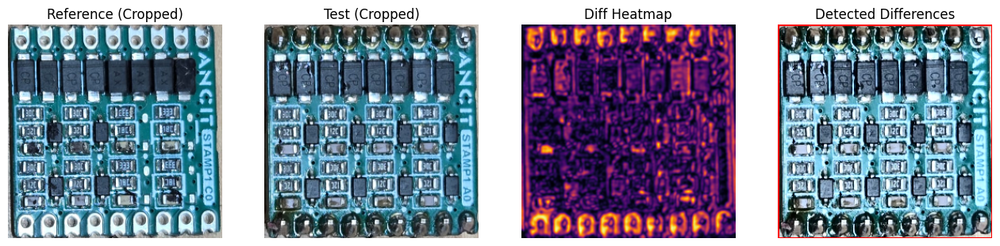

💾 Result saved to: /content/gdrive/MyDrive/pcbs_cae/pcb_diff_filtered.png


In [ ]:
# ==============================================
# PCB Cropping + Difference Detection (Lighting-Invariant, No Alignment)
# ==============================================

from google.colab import drive, files
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# -------------------------------
# Mount Google Drive
# -------------------------------
drive.mount('/content/gdrive')

# -------------------------------
# Load Trained Model
# -------------------------------
MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ Model loaded successfully!")

# -------------------------------
# Improved PCB Cropping Function
# -------------------------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green = np.array([25, 30, 30])
    upper_green = np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y + h, x:x + w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    widthA = np.linalg.norm(br - bl)
    widthB = np.linalg.norm(tr - tl)
    heightA = np.linalg.norm(tr - br)
    heightB = np.linalg.norm(tl - bl)
    maxWidth = int(max(widthA, widthB))
    maxHeight = int(max(heightA, heightB))
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))


# ==============================================
# Upload for cropping or comparison
# ==============================================
print("📤 Upload one PCB image (for crop) or two (for comparison):")
uploaded = files.upload()

if len(uploaded) == 1:
    filename = list(uploaded.keys())[0]
    img = cv2.imdecode(np.frombuffer(uploaded[filename], np.uint8), cv2.IMREAD_COLOR)
    cropped = auto_crop_board_color_based(img)
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("🟩 Cropped PCB Region")
    plt.show()
    cv2.imwrite("cropped_pcb_clean.jpg", cropped)
    files.download("cropped_pcb_clean.jpg")

elif len(uploaded) == 2:
    keys = list(uploaded.keys())
    img1 = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
    img2 = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

    img1_cropped = auto_crop_board_color_based(img1)
    img2_cropped = auto_crop_board_color_based(img2)

    IMG_SIZE = 256
    img1_resized = cv2.resize(img1_cropped, (IMG_SIZE, IMG_SIZE))
    img2_resized = cv2.resize(img2_cropped, (IMG_SIZE, IMG_SIZE))

    # --- Lighting normalization ---
    img1_yuv = cv2.cvtColor(img1_resized, cv2.COLOR_BGR2YCrCb)
    img2_yuv = cv2.cvtColor(img2_resized, cv2.COLOR_BGR2YCrCb)
    img1_yuv[:,:,0] = cv2.equalizeHist(img1_yuv[:,:,0])
    img2_yuv[:,:,0] = cv2.equalizeHist(img2_yuv[:,:,0])
    img1_norm = cv2.cvtColor(img1_yuv, cv2.COLOR_YCrCb2BGR)
    img2_norm = cv2.cvtColor(img2_yuv, cv2.COLOR_YCrCb2BGR)

    img1_rgb = cv2.cvtColor(img1_norm, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    img2_rgb = cv2.cvtColor(img2_norm, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    # --- Model predictions ---
    recon1 = np.squeeze(model.predict(np.expand_dims(img1_rgb, axis=0)))
    recon2 = np.squeeze(model.predict(np.expand_dims(img2_rgb, axis=0)))

    # --- Difference computation ---
    diff_map = np.abs(recon1 - recon2)
    diff_gray = np.mean(diff_map, axis=-1)

    # --- Lighting noise removal ---
    diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

    mx = diff_gray.max() if diff_gray.max() > 0 else 1.0
    diff_gray_norm = (diff_gray * 255.0 / mx).astype(np.uint8)
    _, diff_thresh = cv2.threshold(diff_gray_norm, 30, 255, cv2.THRESH_BINARY)

    # --- Morphological cleaning ---
    kernel = np.ones((3, 3), np.uint8)
    diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel, iterations=1)
    diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

    contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_draw = (img2_rgb * 255).astype(np.uint8).copy()

    for i, cnt in enumerate(contours):
        x, y, w, h = cv2.boundingRect(cnt)
        if w * h > 80:  # ignore tiny lighting noise
            cv2.rectangle(img_draw, (x, y), (x + w, y + h), (255, 0, 0), 2)
            cv2.putText(img_draw, f"#{i + 1}", (x, y - 6), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

    # --- Visualization ---
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 4, 1); plt.title("Reference (Cropped)")
    plt.imshow(cv2.cvtColor(img1_resized, cv2.COLOR_BGR2RGB)); plt.axis('off')
    plt.subplot(1, 4, 2); plt.title("Test (Cropped)")
    plt.imshow(cv2.cvtColor(img2_resized, cv2.COLOR_BGR2RGB)); plt.axis('off')
    plt.subplot(1, 4, 3); plt.title("Diff Heatmap")
    plt.imshow(diff_gray, cmap='inferno'); plt.axis('off')
    plt.subplot(1, 4, 4); plt.title("Detected Differences")
    plt.imshow(img_draw); plt.axis('off')
    plt.show()

    output_path = '/content/gdrive/MyDrive/pcbs_cae/pcb_diff_filtered.png'
    cv2.imwrite(output_path, cv2.cvtColor(img_draw, cv2.COLOR_RGB2BGR))
    print(f"💾 Result saved to: {output_path}")


In [43]:
!apt install tesseract-ocr
!pip install pytesseract


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ CAE model loaded successfully!
📤 Upload Reference PCB and Test PCB images:


Saving 1.jpg to 1 (5).jpg
Saving 2.jpg to 2 (4).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


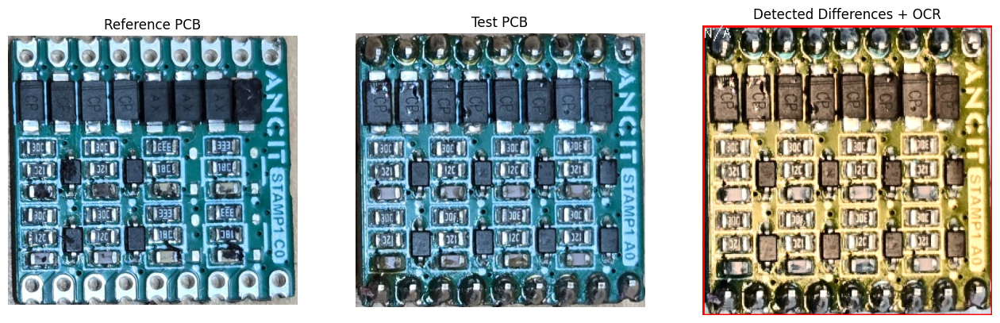


✅ Defects detected: 1
📁 Output saved in: pcb_defect_ocr_out
🧾 JSON map: pcb_defect_ocr_out/defect_ocr_map.json


In [47]:
# ==============================================================
# PCB Defect Detection (CAE) + OCR Label Extraction
# ==============================================================

!apt-get update -qq
!apt-get install -qq -y tesseract-ocr
!pip install -q pytesseract

import os, cv2, json, numpy as np, tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
import pytesseract
import matplotlib.pyplot as plt

# ---------------- Configuration ----------------
OUT_DIR = "pcb_defect_ocr_out"
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "rois"), exist_ok=True)

MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
IMG_SIZE = 256

# ---------------- Mount Google Drive ----------------
drive.mount('/content/gdrive')

# ---------------- Load CAE Model ----------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ CAE model loaded successfully!")

# ---------------- PCB Auto-Crop ----------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green, upper_green = np.array([25, 30, 30]), np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0], rect[2] = pts[np.argmin(s)], pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1], rect[3] = pts[np.argmin(diff)], pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    maxWidth, maxHeight = int(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl))), int(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))
    dst = np.array([[0,0],[maxWidth-1,0],[maxWidth-1,maxHeight-1],[0,maxHeight-1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

# ---------------- OCR Function ----------------
def extract_text_from_roi(roi_img):
    gray = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 5, 75, 75)
    h, w = gray.shape
    if max(h, w) < 40:
        scale = int(40 / max(h, w)) + 1
        gray = cv2.resize(gray, (w*scale, h*scale), interpolation=cv2.INTER_CUBIC)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    config = "--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.-_/:"
    text = pytesseract.image_to_string(thresh, config=config)
    return text.strip().replace("\n", " ")

# ---------------- Upload Images ----------------
print("📤 Upload Reference PCB and Test PCB images:")
uploaded = files.upload()
if len(uploaded) != 2:
    raise ValueError("Please upload exactly two images (reference and test).")

keys = list(uploaded.keys())
ref_img = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
test_img = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ---------------- Cropping ----------------
ref_crop = auto_crop_board_color_based(ref_img)
test_crop = auto_crop_board_color_based(test_img)

# ---------------- Resize + Normalize ----------------
def preprocess(img):
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YCrCb2BGR)
    return img_eq.astype(np.float32) / 255.0

ref_norm = preprocess(ref_crop)
test_norm = preprocess(test_crop)

# ---------------- CAE Difference Map ----------------
recon_ref = np.squeeze(model.predict(np.expand_dims(ref_norm, axis=0)))
recon_test = np.squeeze(model.predict(np.expand_dims(test_norm, axis=0)))

diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

# Normalize + Threshold
diff_norm = (diff_gray * 255 / (diff_gray.max() if diff_gray.max() > 0 else 1)).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_norm, 30, 255, cv2.THRESH_BINARY)

# Morphological cleanup
kernel = np.ones((3, 3), np.uint8)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# ---------------- Contour Detection ----------------
contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
test_display = (test_norm * 255).astype(np.uint8).copy()
detected = []

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    if w * h < 80:  # skip noise
        continue
    roi = test_crop[y:y+h, x:x+w]
    text = extract_text_from_roi(roi)
    cv2.rectangle(test_display, (x, y), (x+w, y+h), (255, 0, 0), 2)
    cv2.putText(test_display, f"{text or 'N/A'}", (x, max(10, y-5)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1)
    roi_path = os.path.join(OUT_DIR, "rois", f"defect_{i:03d}.png")
    cv2.imwrite(roi_path, roi)
    detected.append({"id": f"defect_{i:03d}", "bbox": [x, y, w, h], "ocr_text": text, "roi_path": roi_path})

# ---------------- Visualization ----------------
plt.figure(figsize=(16, 6))
plt.subplot(1, 3, 1); plt.title("Reference PCB"); plt.imshow(cv2.cvtColor(ref_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 3, 2); plt.title("Test PCB"); plt.imshow(cv2.cvtColor(test_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 3, 3); plt.title("Detected Differences + OCR"); plt.imshow(test_display); plt.axis('off')
plt.show()

# ---------------- Save Results ----------------
json_path = os.path.join(OUT_DIR, "defect_ocr_map.json")
with open(json_path, "w") as f:
    json.dump({"detected_defects": detected, "num_defects": len(detected)}, f, indent=2)

cv2.imwrite(os.path.join(OUT_DIR, "defect_ocr_result.png"), cv2.cvtColor(test_display, cv2.COLOR_RGB2BGR))
print(f"\n✅ Defects detected: {len(detected)}")
print(f"📁 Output saved in: {OUT_DIR}")
print(f"🧾 JSON map: {json_path}")


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ CAE model loaded successfully!
📤 Upload Reference PCB and Test PCB images:


Saving mas.jpg to mas (4).jpg
Saving test.jpg to test (4).jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

🟡 Detected Differences with Explanation:
   🔸 Surface irregularity or discoloration at (x=0, y=0, w=256, h=256) | text='N/A'


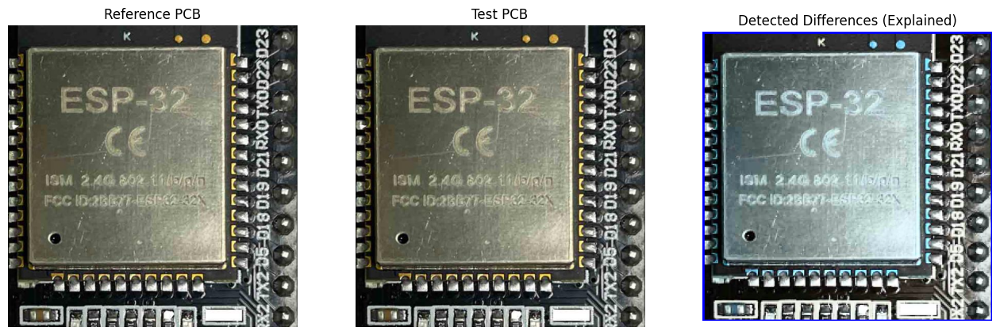


✅ Defects detected: 1
📁 Output saved in: pcb_defect_ocr_out
🧾 JSON map: pcb_defect_ocr_out/defect_explained_map.json


In [51]:
# ==============================================================
# PCB Defect Detection (CAE) + OCR Label Extraction + Difference Explanation
# ==============================================================

!apt-get update -qq
!apt-get install -qq -y tesseract-ocr
!pip install -q pytesseract

import os, cv2, json, numpy as np, tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
import pytesseract
import matplotlib.pyplot as plt

# ---------------- Configuration ----------------
OUT_DIR = "pcb_defect_ocr_out"
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "rois"), exist_ok=True)

MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
IMG_SIZE = 256

# ---------------- Mount Google Drive ----------------
drive.mount('/content/gdrive')

# ---------------- Load CAE Model ----------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ CAE model loaded successfully!")

# ---------------- PCB Auto-Crop ----------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green, upper_green = np.array([25, 30, 30]), np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0], rect[2] = pts[np.argmin(s)], pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1], rect[3] = pts[np.argmin(diff)], pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    maxWidth, maxHeight = int(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl))), int(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))
    dst = np.array([[0,0],[maxWidth-1,0],[maxWidth-1,maxHeight-1],[0,maxHeight-1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

# ---------------- OCR Function ----------------
def extract_text_from_roi(roi_img):
    gray = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 5, 75, 75)
    h, w = gray.shape
    if max(h, w) < 40:
        scale = int(40 / max(h, w)) + 1
        gray = cv2.resize(gray, (w*scale, h*scale), interpolation=cv2.INTER_CUBIC)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    config = "--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.-_/:"
    text = pytesseract.image_to_string(thresh, config=config)
    return text.strip().replace("\n", " ")

# ---------------- Upload Images ----------------
print("📤 Upload Reference PCB and Test PCB images:")
uploaded = files.upload()
if len(uploaded) != 2:
    raise ValueError("Please upload exactly two images (reference and test).")

keys = list(uploaded.keys())
ref_img = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
test_img = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ---------------- Cropping ----------------
ref_crop = auto_crop_board_color_based(ref_img)
test_crop = auto_crop_board_color_based(test_img)

# ---------------- Resize + Normalize ----------------
def preprocess(img):
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YCrCb2BGR)
    return img_eq.astype(np.float32) / 255.0

ref_norm = preprocess(ref_crop)
test_norm = preprocess(test_crop)

# ---------------- CAE Difference Map ----------------
recon_ref = np.squeeze(model.predict(np.expand_dims(ref_norm, axis=0)))
recon_test = np.squeeze(model.predict(np.expand_dims(test_norm, axis=0)))

diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

# Normalize + Threshold
diff_norm = (diff_gray * 255 / (diff_gray.max() if diff_gray.max() > 0 else 1)).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_norm, 30, 255, cv2.THRESH_BINARY)

# Morphological cleanup
kernel = np.ones((3, 3), np.uint8)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# ---------------- Contour Detection + Classification ----------------
contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
test_display = (test_norm * 255).astype(np.uint8).copy()
detected = []

print("\n🟡 Detected Differences with Explanation:")
for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    area = w * h
    if area < 80:
        continue

    roi = test_crop[y:y+h, x:x+w]
    text = extract_text_from_roi(roi)

    # --- Classify difference type ---
    mean_intensity = np.mean(cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY))
    if text:
        defect_type = "Label/Text mismatch or misprint"
    elif mean_intensity < 50:
        defect_type = "Missing or removed component"
    elif mean_intensity > 180:
        defect_type = "Extra solder or short circuit"
    else:
        defect_type = "Surface irregularity or discoloration"

    # Draw and log
    cv2.rectangle(test_display, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(test_display, f"{defect_type}", (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1)

    roi_path = os.path.join(OUT_DIR, "rois", f"defect_{i:03d}.png")
    cv2.imwrite(roi_path, roi)

    detected.append({
        "id": f"defect_{i:03d}",
        "bbox": [int(x), int(y), int(w), int(h)],
        "area": int(area),
        "mean_intensity": float(mean_intensity),
        "ocr_text": text,
        "defect_type": defect_type,
        "roi_path": roi_path
    })

    print(f"   🔸 {defect_type} at (x={x}, y={y}, w={w}, h={h}) | text='{text or 'N/A'}'")

# ---------------- Visualization ----------------
plt.figure(figsize=(16, 6))
plt.subplot(1, 3, 1); plt.title("Reference PCB"); plt.imshow(cv2.cvtColor(ref_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 3, 2); plt.title("Test PCB"); plt.imshow(cv2.cvtColor(test_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 3, 3); plt.title("Detected Differences (Explained)"); plt.imshow(test_display); plt.axis('off')
plt.show()

# ---------------- Save Results ----------------
json_path = os.path.join(OUT_DIR, "defect_explained_map.json")
with open(json_path, "w") as f:
    json.dump({"detected_defects": detected, "num_defects": len(detected)}, f, indent=2)

cv2.imwrite(os.path.join(OUT_DIR, "defect_explained_result.png"), cv2.cvtColor(test_display, cv2.COLOR_RGB2BGR))
print(f"\n✅ Defects detected: {len(detected)}")
print(f"📁 Output saved in: {OUT_DIR}")
print(f"🧾 JSON map: {json_path}")


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ CAE model loaded successfully!
📤 Upload Reference PCB and Test PCB images:


Saving 1.jpg to 1 (8).jpg
Saving 2.jpg to 2 (7).jpg
🔹 Auto-cropping full PCB image (591x1280)...
🔹 Auto-cropping full PCB image (591x1280)...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

🟡 Detected Differences with Explanation:
   🔸 Surface irregularity or discoloration at (x=0, y=0, w=256, h=256) | text='N/A'


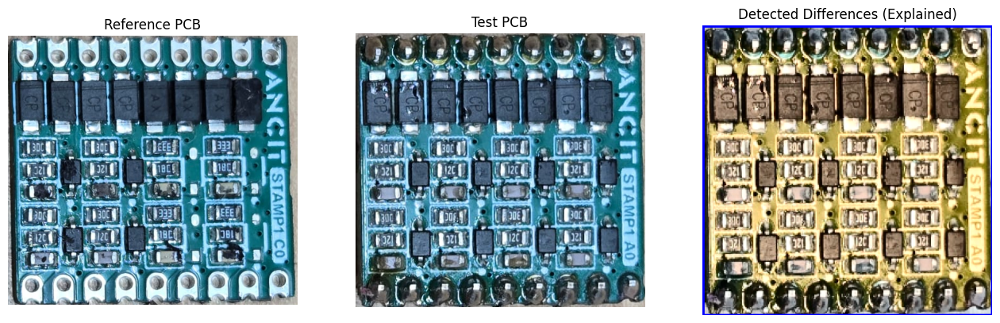


✅ Defects detected: 1
📁 Output saved in: pcb_defect_ocr_out
🧾 JSON map: pcb_defect_ocr_out/defect_explained_map.json


In [53]:
# ==============================================================
# PCB Defect Detection (CAE) + OCR Label Extraction + Difference Explanation
# ==============================================================

!apt-get update -qq
!apt-get install -qq -y tesseract-ocr
!pip install -q pytesseract

import os, cv2, json, numpy as np, tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
import pytesseract
import matplotlib.pyplot as plt

# ---------------- Configuration ----------------
OUT_DIR = "pcb_defect_ocr_out"
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "rois"), exist_ok=True)

MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
IMG_SIZE = 256

# ---------------- Mount Google Drive ----------------
drive.mount('/content/gdrive')

# ---------------- Load CAE Model ----------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ CAE model loaded successfully!")

# ---------------- PCB Auto-Crop ----------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green, upper_green = np.array([25, 30, 30]), np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0], rect[2] = pts[np.argmin(s)], pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1], rect[3] = pts[np.argmin(diff)], pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    maxWidth, maxHeight = int(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl))), int(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))
    dst = np.array([[0,0],[maxWidth-1,0],[maxWidth-1,maxHeight-1],[0,maxHeight-1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

# ---------------- Smart Crop Decision ----------------
def smart_crop(image):
    """Automatically decide whether to crop full PCB or leave cropped section as-is."""
    h, w, _ = image.shape
    if h < 400 or w < 400:
        print(f"⚠️ Skipping auto-crop (image already cropped: {w}x{h}).")
        return image
    else:
        print(f"🔹 Auto-cropping full PCB image ({w}x{h})...")
        return auto_crop_board_color_based(image)

# ---------------- OCR Function ----------------
def extract_text_from_roi(roi_img):
    gray = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 5, 75, 75)
    h, w = gray.shape
    if max(h, w) < 40:
        scale = int(40 / max(h, w)) + 1
        gray = cv2.resize(gray, (w*scale, h*scale), interpolation=cv2.INTER_CUBIC)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    config = "--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.-_/:"
    text = pytesseract.image_to_string(thresh, config=config)
    return text.strip().replace("\n", " ")

# ---------------- Upload Images ----------------
print("📤 Upload Reference PCB and Test PCB images:")
uploaded = files.upload()
if len(uploaded) != 2:
    raise ValueError("Please upload exactly two images (reference and test).")

keys = list(uploaded.keys())
ref_img = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
test_img = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ---------------- Smart Cropping ----------------
ref_crop = smart_crop(ref_img)
test_crop = smart_crop(test_img)

# ---------------- Resize + Normalize ----------------
def preprocess(img):
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YCrCb2BGR)
    return img_eq.astype(np.float32) / 255.0

ref_norm = preprocess(ref_crop)
test_norm = preprocess(test_crop)

# ---------------- CAE Difference Map ----------------
recon_ref = np.squeeze(model.predict(np.expand_dims(ref_norm, axis=0)))
recon_test = np.squeeze(model.predict(np.expand_dims(test_norm, axis=0)))

diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

# Normalize + Threshold
diff_norm = (diff_gray * 255 / (diff_gray.max() if diff_gray.max() > 0 else 1)).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_norm, 30, 255, cv2.THRESH_BINARY)

# Morphological cleanup
kernel = np.ones((3, 3), np.uint8)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# ---------------- Contour Detection + Classification ----------------
contours, _ = cv2.findContours(diff_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
test_display = (test_norm * 255).astype(np.uint8).copy()
detected = []

print("\n🟡 Detected Differences with Explanation:")
for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    area = w * h
    if area < 80:
        continue

    roi = test_crop[y:y+h, x:x+w]
    text = extract_text_from_roi(roi)

    # --- Classify difference type ---
    mean_intensity = np.mean(cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY))
    if text:
        defect_type = "Label/Text mismatch or misprint"
    elif mean_intensity < 50:
        defect_type = "Missing or removed component"
    elif mean_intensity > 180:
        defect_type = "Extra solder or short circuit"
    else:
        defect_type = "Surface irregularity or discoloration"

    # Draw and log
    cv2.rectangle(test_display, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(test_display, f"{defect_type}", (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1)

    roi_path = os.path.join(OUT_DIR, "rois", f"defect_{i:03d}.png")
    cv2.imwrite(roi_path, roi)

    detected.append({
        "id": f"defect_{i:03d}",
        "bbox": [int(x), int(y), int(w), int(h)],
        "area": int(area),
        "mean_intensity": float(mean_intensity),
        "ocr_text": text,
        "defect_type": defect_type,
        "roi_path": roi_path
    })

    print(f"   🔸 {defect_type} at (x={x}, y={y}, w={w}, h={h}) | text='{text or 'N/A'}'")

# ---------------- Visualization ----------------
plt.figure(figsize=(16, 6))
plt.subplot(1, 3, 1); plt.title("Reference PCB"); plt.imshow(cv2.cvtColor(ref_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 3, 2); plt.title("Test PCB"); plt.imshow(cv2.cvtColor(test_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 3, 3); plt.title("Detected Differences (Explained)"); plt.imshow(test_display); plt.axis('off')
plt.show()

# ---------------- Save Results ----------------
json_path = os.path.join(OUT_DIR, "defect_explained_map.json")
with open(json_path, "w") as f:
    json.dump({"detected_defects": detected, "num_defects": len(detected)}, f, indent=2)

cv2.imwrite(os.path.join(OUT_DIR, "defect_explained_result.png"), cv2.cvtColor(test_display, cv2.COLOR_RGB2BGR))
print(f"\n✅ Defects detected: {len(detected)}")
print(f"📁 Output saved in: {OUT_DIR}")
print(f"🧾 JSON map: {json_path}")


In [54]:
diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
cv2.imwrite("debug_recon_ref.png", (recon_ref * 255).astype(np.uint8))
cv2.imwrite("debug_recon_test.png", (recon_test * 255).astype(np.uint8))
cv2.imwrite("debug_diff.png", (diff_gray * 255).astype(np.uint8))


True

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ CAE model loaded successfully!
📤 Upload Reference PCB and Test PCB images:


Saving 1.jpg to 1 (9).jpg
Saving 2.jpg to 2 (8).jpg
🔹 Auto-cropping full PCB image (591x1280)...
🔹 Auto-cropping full PCB image (591x1280)...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

📊 Structural Similarity Index (SSIM): 0.1929

🟡 Detected Differences with Explanation:
   🔸 Surface irregularity or discoloration at (x=0, y=0, w=256, h=256) | text='N/A'


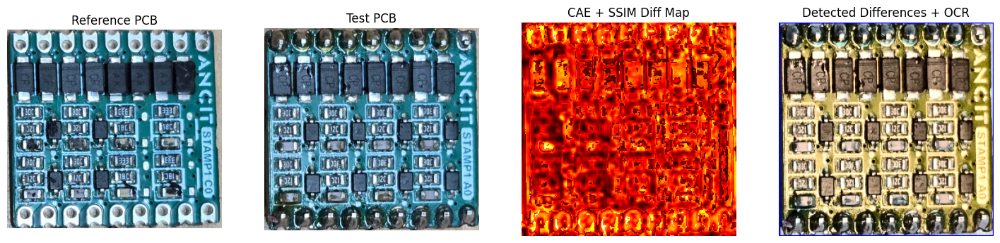


✅ Defects detected: 1
📁 Output saved in: pcb_defect_ocr_out
🧾 JSON map: pcb_defect_ocr_out/defect_explained_map.json
📈 SSIM Score: 0.1929 (1.0 means identical boards)


In [55]:
# ==============================================================
# PCB Defect Detection (CAE + SSIM + OCR) with Difference Explanation
# ==============================================================

!apt-get update -qq
!apt-get install -qq -y tesseract-ocr
!pip install -q pytesseract scikit-image

import os, cv2, json, numpy as np, tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
import pytesseract
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# ---------------- Configuration ----------------
OUT_DIR = "pcb_defect_ocr_out"
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "rois"), exist_ok=True)

MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
IMG_SIZE = 256

# ---------------- Mount Google Drive ----------------
drive.mount('/content/gdrive')

# ---------------- Load CAE Model ----------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ CAE model loaded successfully!")

# ---------------- PCB Auto-Crop ----------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green, upper_green = np.array([25, 30, 30]), np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0], rect[2] = pts[np.argmin(s)], pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1], rect[3] = pts[np.argmin(diff)], pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    maxWidth, maxHeight = int(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl))), int(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))
    dst = np.array([[0,0],[maxWidth-1,0],[maxWidth-1,maxHeight-1],[0,maxHeight-1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

# ---------------- Smart Crop Decision ----------------
def smart_crop(image):
    h, w, _ = image.shape
    if h < 400 or w < 400:
        print(f"⚠️ Skipping auto-crop (image already cropped: {w}x{h}).")
        return image
    else:
        print(f"🔹 Auto-cropping full PCB image ({w}x{h})...")
        return auto_crop_board_color_based(image)

# ---------------- OCR Function ----------------
def extract_text_from_roi(roi_img):
    gray = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)
    gray = cv2.bilateralFilter(gray, 5, 75, 75)
    h, w = gray.shape
    if max(h, w) < 40:
        scale = int(40 / max(h, w)) + 1
        gray = cv2.resize(gray, (w*scale, h*scale), interpolation=cv2.INTER_CUBIC)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    config = "--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.-_/:"
    text = pytesseract.image_to_string(thresh, config=config)
    return text.strip().replace("\n", " ")

# ---------------- Upload Images ----------------
print("📤 Upload Reference PCB and Test PCB images:")
uploaded = files.upload()
if len(uploaded) != 2:
    raise ValueError("Please upload exactly two images (reference and test).")

keys = list(uploaded.keys())
ref_img = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
test_img = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ---------------- Smart Cropping ----------------
ref_crop = smart_crop(ref_img)
test_crop = smart_crop(test_img)

# ---------------- Resize + Normalize ----------------
def preprocess(img):
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YCrCb2BGR)
    return img_eq.astype(np.float32) / 255.0

ref_norm = preprocess(ref_crop)
test_norm = preprocess(test_crop)

# ---------------- CAE Difference Map ----------------
recon_ref = np.squeeze(model.predict(np.expand_dims(ref_norm, axis=0)))
recon_test = np.squeeze(model.predict(np.expand_dims(test_norm, axis=0)))

diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

# Normalize + Threshold
diff_norm = (diff_gray * 255 / (diff_gray.max() if diff_gray.max() > 0 else 1)).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_norm, 30, 255, cv2.THRESH_BINARY)

# Morphological cleanup
kernel = np.ones((3, 3), np.uint8)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# ---------------- Structural Similarity (SSIM) ----------------
grayA = cv2.cvtColor((ref_norm * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor((test_norm * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
ssim_score, ssim_diff = ssim(grayA, grayB, full=True)
print(f"\n📊 Structural Similarity Index (SSIM): {ssim_score:.4f}")
ssim_diff = (1 - ssim_diff) * 255
ssim_diff = ssim_diff.astype("uint8")

# Combine CAE + SSIM maps
combined_diff = cv2.addWeighted(diff_norm, 0.6, ssim_diff, 0.4, 0)

# ---------------- Contour Detection ----------------
contours, _ = cv2.findContours(combined_diff, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
test_display = (test_norm * 255).astype(np.uint8).copy()
detected = []

print("\n🟡 Detected Differences with Explanation:")
for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    area = w * h
    if area < 80:
        continue

    roi = test_crop[y:y+h, x:x+w]
    text = extract_text_from_roi(roi)

    mean_intensity = np.mean(cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY))
    if text:
        defect_type = "Label/Text mismatch or misprint"
    elif mean_intensity < 50:
        defect_type = "Missing or removed component"
    elif mean_intensity > 180:
        defect_type = "Extra solder or short circuit"
    else:
        defect_type = "Surface irregularity or discoloration"

    cv2.rectangle(test_display, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(test_display, f"{defect_type}", (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1)

    roi_path = os.path.join(OUT_DIR, "rois", f"defect_{i:03d}.png")
    cv2.imwrite(roi_path, roi)

    detected.append({
        "id": f"defect_{i:03d}",
        "bbox": [int(x), int(y), int(w), int(h)],
        "area": int(area),
        "mean_intensity": float(mean_intensity),
        "ocr_text": text,
        "defect_type": defect_type,
        "roi_path": roi_path
    })

    print(f"   🔸 {defect_type} at (x={x}, y={y}, w={w}, h={h}) | text='{text or 'N/A'}'")

# ---------------- Visualization ----------------
plt.figure(figsize=(18, 6))
plt.subplot(1, 4, 1); plt.title("Reference PCB"); plt.imshow(cv2.cvtColor(ref_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 4, 2); plt.title("Test PCB"); plt.imshow(cv2.cvtColor(test_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 4, 3); plt.title("CAE + SSIM Diff Map"); plt.imshow(combined_diff, cmap='hot'); plt.axis('off')
plt.subplot(1, 4, 4); plt.title("Detected Differences + OCR"); plt.imshow(test_display); plt.axis('off')
plt.show()

# ---------------- Save Results ----------------
json_path = os.path.join(OUT_DIR, "defect_explained_map.json")
with open(json_path, "w") as f:
    json.dump({"detected_defects": detected, "num_defects": len(detected), "ssim_score": float(ssim_score)}, f, indent=2)

cv2.imwrite(os.path.join(OUT_DIR, "defect_explained_result.png"), cv2.cvtColor(test_display, cv2.COLOR_RGB2BGR))
print(f"\n✅ Defects detected: {len(detected)}")
print(f"📁 Output saved in: {OUT_DIR}")
print(f"🧾 JSON map: {json_path}")
print(f"📈 SSIM Score: {ssim_score:.4f} (1.0 means identical boards)")


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ CAE model loaded successfully!
📤 Upload Reference PCB and Test PCB images:


Saving 1.jpg to 1 (10).jpg
Saving 2.jpg to 2 (9).jpg
🔹 Auto-cropping full PCB image (591x1280)...
🔹 Auto-cropping full PCB image (591x1280)...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step

📊 Structural Similarity Index (SSIM): 0.1929

🟡 Detected Differences with Explanation:
🟢 OCR Debug (defect_000): ''


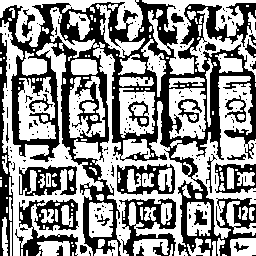

   🔸 Surface irregularity or discoloration at (x=0, y=0, w=256, h=256) | text='N/A'


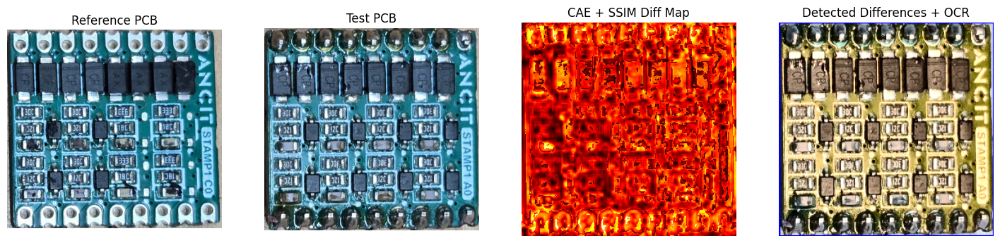


✅ Defects detected: 1
📁 Output saved in: pcb_defect_ocr_out
🧾 JSON map: pcb_defect_ocr_out/defect_explained_map.json
📈 SSIM Score: 0.1929 (1.0 means identical boards)


In [56]:
# ==============================================================
# PCB Defect Detection (CAE + SSIM + OCR) with Difference Explanation
# ==============================================================

!apt-get update -qq
!apt-get install -qq -y tesseract-ocr
!pip install -q pytesseract scikit-image

import os, cv2, json, numpy as np, tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
import pytesseract
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# ---------------- Configuration ----------------
OUT_DIR = "pcb_defect_ocr_out"
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "rois"), exist_ok=True)

MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
IMG_SIZE = 256

# ---------------- Mount Google Drive ----------------
drive.mount('/content/gdrive')

# ---------------- Load CAE Model ----------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ CAE model loaded successfully!")

# ---------------- PCB Auto-Crop ----------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green, upper_green = np.array([25, 30, 30]), np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0], rect[2] = pts[np.argmin(s)], pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1], rect[3] = pts[np.argmin(diff)], pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    maxWidth, maxHeight = int(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl))), int(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))
    dst = np.array([[0,0],[maxWidth-1,0],[maxWidth-1,maxHeight-1],[0,maxHeight-1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

# ---------------- Smart Crop Decision ----------------
def smart_crop(image):
    h, w, _ = image.shape
    if h < 400 or w < 400:
        print(f"⚠️ Skipping auto-crop (image already cropped: {w}x{h}).")
        return image
    else:
        print(f"🔹 Auto-cropping full PCB image ({w}x{h})...")
        return auto_crop_board_color_based(image)

# ---------------- Improved OCR Function ----------------
def extract_text_from_roi(roi_img, debug=False, roi_name=""):
    gray = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)

    # 1️⃣ Local contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)

    # 2️⃣ Adaptive threshold for variable lighting
    thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 31, 15)

    # 3️⃣ Morphological cleanup
    kernel = np.ones((2,2), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)

    # 4️⃣ Upscale small text
    h, w = thresh.shape
    if max(h, w) < 60:
        scale = int(60 / max(h, w)) + 1
        thresh = cv2.resize(thresh, (w*scale, h*scale), interpolation=cv2.INTER_CUBIC)

    # 5️⃣ Invert to black text on white background
    thresh = cv2.bitwise_not(thresh)

    # 6️⃣ OCR config — single character focus
    config = (
        "--psm 10 "
        "-c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.-_/+:"
    )
    text = pytesseract.image_to_string(thresh, config=config).strip().replace("\n", " ")

    if debug:
        print(f"🟢 OCR Debug ({roi_name}): '{text}'")
        cv2_imshow(thresh)

    return text

# ---------------- Upload Images ----------------
print("📤 Upload Reference PCB and Test PCB images:")
uploaded = files.upload()
if len(uploaded) != 2:
    raise ValueError("Please upload exactly two images (reference and test).")

keys = list(uploaded.keys())
ref_img = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
test_img = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ---------------- Smart Cropping ----------------
ref_crop = smart_crop(ref_img)
test_crop = smart_crop(test_img)

# ---------------- Resize + Normalize ----------------
def preprocess(img):
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YCrCb2BGR)
    return img_eq.astype(np.float32) / 255.0

ref_norm = preprocess(ref_crop)
test_norm = preprocess(test_crop)

# ---------------- CAE Difference Map ----------------
recon_ref = np.squeeze(model.predict(np.expand_dims(ref_norm, axis=0)))
recon_test = np.squeeze(model.predict(np.expand_dims(test_norm, axis=0)))

diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)

# Normalize + Threshold
diff_norm = (diff_gray * 255 / (diff_gray.max() if diff_gray.max() > 0 else 1)).astype(np.uint8)
_, diff_thresh = cv2.threshold(diff_norm, 30, 255, cv2.THRESH_BINARY)

# Morphological cleanup
kernel = np.ones((3, 3), np.uint8)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_OPEN, kernel)
diff_thresh = cv2.morphologyEx(diff_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# ---------------- Structural Similarity (SSIM) ----------------
grayA = cv2.cvtColor((ref_norm * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor((test_norm * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
ssim_score, ssim_diff = ssim(grayA, grayB, full=True)
print(f"\n📊 Structural Similarity Index (SSIM): {ssim_score:.4f}")
ssim_diff = (1 - ssim_diff) * 255
ssim_diff = ssim_diff.astype("uint8")

# Combine CAE + SSIM maps
combined_diff = cv2.addWeighted(diff_norm, 0.6, ssim_diff, 0.4, 0)

# ---------------- Contour Detection ----------------
contours, _ = cv2.findContours(combined_diff, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
test_display = (test_norm * 255).astype(np.uint8).copy()
detected = []

print("\n🟡 Detected Differences with Explanation:")
for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    area = w * h
    if area < 80:
        continue

    roi = test_crop[y:y+h, x:x+w]
    text = extract_text_from_roi(roi, debug=True, roi_name=f"defect_{i:03d}")

    mean_intensity = np.mean(cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY))
    if text:
        defect_type = "Label/Text mismatch or misprint"
    elif mean_intensity < 50:
        defect_type = "Missing or removed component"
    elif mean_intensity > 180:
        defect_type = "Extra solder or short circuit"
    else:
        defect_type = "Surface irregularity or discoloration"

    cv2.rectangle(test_display, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(test_display, f"{defect_type}", (x, y-5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255,255,255), 1)

    roi_path = os.path.join(OUT_DIR, "rois", f"defect_{i:03d}.png")
    cv2.imwrite(roi_path, roi)

    detected.append({
        "id": f"defect_{i:03d}",
        "bbox": [int(x), int(y), int(w), int(h)],
        "area": int(area),
        "mean_intensity": float(mean_intensity),
        "ocr_text": text,
        "defect_type": defect_type,
        "roi_path": roi_path
    })

    print(f"   🔸 {defect_type} at (x={x}, y={y}, w={w}, h={h}) | text='{text or 'N/A'}'")

# ---------------- Visualization ----------------
plt.figure(figsize=(18, 6))
plt.subplot(1, 4, 1); plt.title("Reference PCB"); plt.imshow(cv2.cvtColor(ref_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 4, 2); plt.title("Test PCB"); plt.imshow(cv2.cvtColor(test_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 4, 3); plt.title("CAE + SSIM Diff Map"); plt.imshow(combined_diff, cmap='hot'); plt.axis('off')
plt.subplot(1, 4, 4); plt.title("Detected Differences + OCR"); plt.imshow(test_display); plt.axis('off')
plt.show()

# ---------------- Save Results ----------------
json_path = os.path.join(OUT_DIR, "defect_explained_map.json")
with open(json_path, "w") as f:
    json.dump({"detected_defects": detected, "num_defects": len(detected), "ssim_score": float(ssim_score)}, f, indent=2)

cv2.imwrite(os.path.join(OUT_DIR, "defect_explained_result.png"), cv2.cvtColor(test_display, cv2.COLOR_RGB2BGR))
print(f"\n✅ Defects detected: {len(detected)}")
print(f"📁 Output saved in: {OUT_DIR}")
print(f"🧾 JSON map: {json_path}")
print(f"📈 SSIM Score: {ssim_score:.4f} (1.0 means identical boards)")


W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
✅ CAE model loaded successfully!
📤 Upload Reference PCB and Test PCB images:


Saving 1.jpg to 1 (14).jpg
Saving 2.jpg to 2 (13).jpg
🔹 Auto-cropping full PCB image (591x1280)...
🔹 Auto-cropping full PCB image (591x1280)...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

📊 Structural Similarity Index (SSIM): 0.1929

🟡 Detected Differences with Detailed Small Boxes:
   • detail_def_0000 | Text mismatch: 'EB' → 'ER' | bbox=[0, 0, 121, 169] | area=20449 px | ref_text='EB' | test_text='ER'
   • detail_def_0001 | Text mismatch: '_' → '-' | bbox=[39, 0, 8, 3] | area=24 px | ref_text='_' | test_text='-'
   • detail_def_0002 | Visual anomaly | bbox=[70, 0, 186, 256] | area=47616 px | ref_text='N/A' | test_text='N/A'
   • detail_def_0003 | Missing marking/component | bbox=[160, 26, 13, 19] | area=247 px | ref_text='Y' | test_text='N/A'
   • detail_def_0004 | Text mismatch: '5' → 'PT' | bbox=[29, 33, 9, 13] | area=117 px | ref_text='5' | test_text='PT'
   • detail_def_0005 | Extra marking/component | bbox=[105, 56, 9, 9] | area=81 px | ref_text

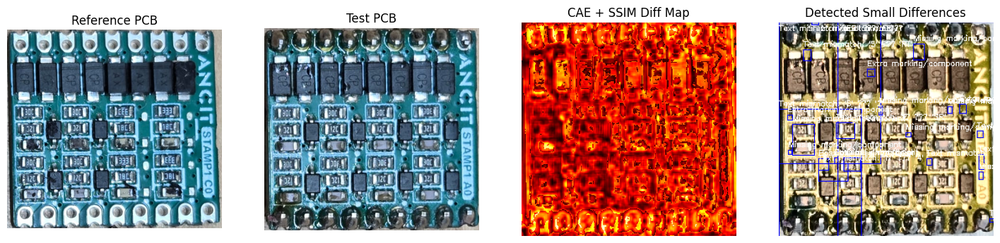


✅ Small-box differences detected: 24
📁 Output saved in: pcb_defect_ocr_out
🧾 JSON map: pcb_defect_ocr_out/defect_detailed_map.json
📈 SSIM Score: 0.1929 (1.0 means identical boards)


In [60]:
# ==============================================================
# PCB Defect Detection (CAE + SSIM + OCR) with Detailed Small-box Differences
# ==============================================================

!apt-get update -qq
!apt-get install -qq -y tesseract-ocr
!pip install -q pytesseract scikit-image

import os, cv2, json, numpy as np, tensorflow as tf
from google.colab import files, drive
from google.colab.patches import cv2_imshow
import pytesseract
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

# ---------------- Configuration ----------------
OUT_DIR = "pcb_defect_ocr_out"
os.makedirs(OUT_DIR, exist_ok=True)
os.makedirs(os.path.join(OUT_DIR, "rois"), exist_ok=True)

MODEL_PATH = '/content/gdrive/MyDrive/pcbs_cae/training_3-1_s1024/2025-11-01_07-21-07.045420/best_model_val_loss.h5'
IMG_SIZE = 256

# ---------------- Mount Google Drive ----------------
drive.mount('/content/gdrive')

# ---------------- Load CAE Model ----------------
model = tf.keras.models.load_model(MODEL_PATH, compile=False)
print("✅ CAE model loaded successfully!")

# ---------------- PCB Auto-Crop ----------------
def auto_crop_board_color_based(image):
    img = image.copy()
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_green, upper_green = np.array([25, 30, 30]), np.array([100, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return cv2.resize(img, (512, 512))
    c = max(contours, key=cv2.contourArea)
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    if len(approx) != 4:
        x, y, w, h = cv2.boundingRect(c)
        return img[y:y+h, x:x+w]
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0], rect[2] = pts[np.argmin(s)], pts[np.argmax(s)]
        diff = np.diff(pts, axis=1)
        rect[1], rect[3] = pts[np.argmin(diff)], pts[np.argmax(diff)]
        return rect
    rect = order_points(approx.reshape(4, 2))
    (tl, tr, br, bl) = rect
    maxWidth, maxHeight = int(max(np.linalg.norm(br-bl), np.linalg.norm(tr-tl))), int(max(np.linalg.norm(tr-br), np.linalg.norm(tl-bl)))
    dst = np.array([[0,0],[maxWidth-1,0],[maxWidth-1,maxHeight-1],[0,maxHeight-1]], dtype="float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    return cv2.warpPerspective(img, M, (maxWidth, maxHeight))

# ---------------- Smart Crop Decision ----------------
def smart_crop(image):
    h, w, _ = image.shape
    if h < 400 or w < 400:
        print(f"⚠️ Skipping auto-crop (image already cropped: {w}x{h}).")
        return image
    else:
        print(f"🔹 Auto-cropping full PCB image ({w}x{h})...")
        return auto_crop_board_color_based(image)

# ---------------- Improved OCR Function ----------------
def extract_text_from_roi(roi_img, debug=False, roi_name=""):
    gray = cv2.cvtColor(roi_img, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)
    thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 31, 15)
    kernel = np.ones((2,2), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
    h, w = thresh.shape
    if max(h, w) < 60:
        scale = int(60 / max(h, w)) + 1
        thresh = cv2.resize(thresh, (w*scale, h*scale), interpolation=cv2.INTER_CUBIC)
    thresh = cv2.bitwise_not(thresh)
    config = (
        "--psm 10 "
        "-c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789.-_/+:"
    )
    text = pytesseract.image_to_string(thresh, config=config).strip().replace("\n", " ")
    if debug:
        print(f"🟢 OCR Debug ({roi_name}): '{text}'")
        cv2_imshow(thresh)
    return text

# ---------------- Upload Images ----------------
print("📤 Upload Reference PCB and Test PCB images:")
uploaded = files.upload()
if len(uploaded) != 2:
    raise ValueError("Please upload exactly two images (reference and test).")

keys = list(uploaded.keys())
ref_img = cv2.imdecode(np.frombuffer(uploaded[keys[0]], np.uint8), cv2.IMREAD_COLOR)
test_img = cv2.imdecode(np.frombuffer(uploaded[keys[1]], np.uint8), cv2.IMREAD_COLOR)

# ---------------- Smart Cropping ----------------
ref_crop = smart_crop(ref_img)
test_crop = smart_crop(test_img)

# ---------------- Resize + Normalize ----------------
def preprocess(img):
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
    img_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YCrCb2BGR)
    return img_eq.astype(np.float32) / 255.0

ref_norm = preprocess(ref_crop)
test_norm = preprocess(test_crop)

# ---------------- CAE Difference Map ----------------
recon_ref = np.squeeze(model.predict(np.expand_dims(ref_norm, axis=0)))
recon_test = np.squeeze(model.predict(np.expand_dims(test_norm, axis=0)))
diff_map = np.abs(recon_ref - recon_test)
diff_gray = np.mean(diff_map, axis=-1)
diff_gray = cv2.GaussianBlur(diff_gray, (5, 5), 0)
diff_norm = (diff_gray * 255 / (diff_gray.max() if diff_gray.max() > 0 else 1)).astype(np.uint8)

# ---------------- SSIM Map ----------------
grayA = cv2.cvtColor((ref_norm * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
grayB = cv2.cvtColor((test_norm * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY)
ssim_score, ssim_diff = ssim(grayA, grayB, full=True)
print(f"\n📊 Structural Similarity Index (SSIM): {ssim_score:.4f}")
ssim_diff = (1 - ssim_diff) * 255
ssim_diff = ssim_diff.astype("uint8")
combined_diff = cv2.addWeighted(diff_norm, 0.6, ssim_diff, 0.4, 0)

# ---------------- Coarse Contours (as before) ----------------
_, combined_thresh = cv2.threshold(combined_diff, 30, 255, cv2.THRESH_BINARY)
kernel = np.ones((3,3), np.uint8)
combined_thresh = cv2.morphologyEx(combined_thresh, cv2.MORPH_OPEN, kernel, iterations=1)
combined_thresh = cv2.morphologyEx(combined_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

contours, _ = cv2.findContours(combined_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# ---------------- Prepare displays ----------------
test_display = (test_norm * 255).astype(np.uint8).copy()
ref_display = (ref_norm * 255).astype(np.uint8).copy()
detected = []
detail_idx = 0

print("\n🟡 Detected Differences with Detailed Small Boxes:")

# For each coarse contour, split into smaller connected components (fine boxes)
for i, cnt in enumerate(contours):
    xC, yC, wC, hC = cv2.boundingRect(cnt)
    if wC * hC < 80:
        continue

    # Crop the combined_diff and threshold locally to find fine blobs
    patch = combined_diff[yC:yC+hC, xC:xC+wC].copy()
    # Use a higher local threshold to isolate tighter blobs
    _, patch_t = cv2.threshold(patch, max(20, int(patch.mean()*0.8)), 255, cv2.THRESH_BINARY)
    # Small opening to separate nearby hits
    kernel2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    patch_t = cv2.morphologyEx(patch_t, cv2.MORPH_OPEN, kernel2, iterations=1)

    # Connected components on the patch
    num_labels, labels_im = cv2.connectedComponents(patch_t.astype(np.uint8))
    for lbl in range(1, num_labels):
        ys, xs = np.where(labels_im == lbl)
        if ys.size == 0 or xs.size == 0:
            continue
        x0_local, x1_local = xs.min(), xs.max()
        y0_local, y1_local = ys.min(), ys.max()
        # convert to global coordinates
        x = xC + int(x0_local)
        y = yC + int(y0_local)
        w = int(x1_local - x0_local) + 1
        h = int(y1_local - y0_local) + 1
        area = w * h
        if area < 20:   # skip tiny noise
            continue

        # Extract ROIs from original crops (use clamp)
        x0g = max(0, x); y0g = max(0, y)
        x1g = min(test_crop.shape[1], x + w); y1g = min(test_crop.shape[0], y + h)
        roi_ref = ref_crop[y0g:y1g, x0g:x1g] if y0g<y1g and x0g<x1g else np.zeros((1,1,3), dtype=np.uint8)
        roi_test = test_crop[y0g:y1g, x0g:x1g] if y0g<y1g and x0g<x1g else np.zeros((1,1,3), dtype=np.uint8)

        # OCR on both small boxes
        ref_text = extract_text_from_roi(roi_ref)
        test_text = extract_text_from_roi(roi_test)

        # Determine difference description
        if ref_text != test_text and ref_text and test_text:
            defect_type = f"Text mismatch: '{ref_text}' → '{test_text}'"
        elif ref_text and not test_text:
            defect_type = "Missing marking/component"
        elif not ref_text and test_text:
            defect_type = "Extra marking/component"
        else:
            # use mean intensity change to guess missing/extra
            mean_ref = np.mean(cv2.cvtColor(roi_ref, cv2.COLOR_BGR2GRAY)) if roi_ref.size else 0
            mean_test = np.mean(cv2.cvtColor(roi_test, cv2.COLOR_BGR2GRAY)) if roi_test.size else 0
            if mean_test + 15 < mean_ref:
                defect_type = "Possible missing/darker"
            elif mean_test > mean_ref + 15:
                defect_type = "Possible extra/bright"
            else:
                defect_type = "Visual anomaly"

        # Draw small red bounding box on test_display
        cv2.rectangle(test_display, (x, y), (x+w, y+h), (0, 0, 255), 1)  # thin small box
        # Put a short label (avoid overflow)
        short_label = defect_type if len(defect_type) < 30 else defect_type[:27] + "..."
        cv2.putText(test_display, f"{short_label}", (x, max(10, y-4)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.30, (255,255,255), 1)

        # Save ROI and append to detected list
        roi_path = os.path.join(OUT_DIR, "rois", f"detail_def_{detail_idx:04d}.png")
        cv2.imwrite(roi_path, roi_test)
        detected.append({
            "id": f"detail_def_{detail_idx:04d}",
            "bbox": [int(x), int(y), int(w), int(h)],
            "area": int(area),
            "ocr_ref": ref_text,
            "ocr_test": test_text,
            "defect_type": defect_type,
            "roi_path": roi_path
        })

        # Print a detailed line for this small box (general format)
        print(f"   • {detected[-1]['id']} | {defect_type} | bbox={detected[-1]['bbox']} | area={area} px | ref_text='{ref_text or 'N/A'}' | test_text='{test_text or 'N/A'}'")

        detail_idx += 1

# ---------------- Visualization (unchanged layout) ----------------
plt.figure(figsize=(18, 6))
plt.subplot(1, 4, 1); plt.title("Reference PCB"); plt.imshow(cv2.cvtColor(ref_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 4, 2); plt.title("Test PCB"); plt.imshow(cv2.cvtColor(test_crop, cv2.COLOR_BGR2RGB)); plt.axis('off')
plt.subplot(1, 4, 3); plt.title("CAE + SSIM Diff Map"); plt.imshow(combined_diff, cmap='hot'); plt.axis('off')
plt.subplot(1, 4, 4); plt.title("Detected Small Differences"); plt.imshow(test_display); plt.axis('off')
plt.show()

# ---------------- Save Results ----------------
json_path = os.path.join(OUT_DIR, "defect_detailed_map.json")
with open(json_path, "w") as f:
    json.dump({"detected_detailed": detected, "num_detections": len(detected), "ssim_score": float(ssim_score)}, f, indent=2)

cv2.imwrite(os.path.join(OUT_DIR, "defect_detailed_result.png"), cv2.cvtColor(test_display, cv2.COLOR_RGB2BGR))
print(f"\n✅ Small-box differences detected: {len(detected)}")
print(f"📁 Output saved in: {OUT_DIR}")
print(f"🧾 JSON map: {json_path}")
print(f"📈 SSIM Score: {ssim_score:.4f} (1.0 means identical boards)")
